In [42]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as cx
from pysal.lib import weights
from pysal.explore import esda
from splot import esda as esdaplot

In [171]:
gdf = gpd.read_file("../data/Transformed/gdf.geojson")
grida = gpd.read_file("../data/Transformed/grida.geojson")
Landmarks = gpd.read_file("../data/Transformed/Landmarks.geojson")

In [124]:
heat_list = ['M/V ACCIDENT','EMERGANCY SERVICES','LOST MOTOR VEHICLE','ASSAULT',
             'DRUGS','VERBAL DISPUTE','THREATS TO DO BODILY HARM','MISSING PERSON']
basemap = cx.providers.CartoDB.Positron
type = ['TOTAL RATE','M/V ACCIDENT RATE','EMERGANCY SERVICES RATE','LOST MOTOR VEHICLE RATE','ASSAULT RATE',
        'DRUGS RATE','VERBAL DISPUTE RATE','THREATS TO DO BODILY HARM RATE','MISSING PERSON RATE']

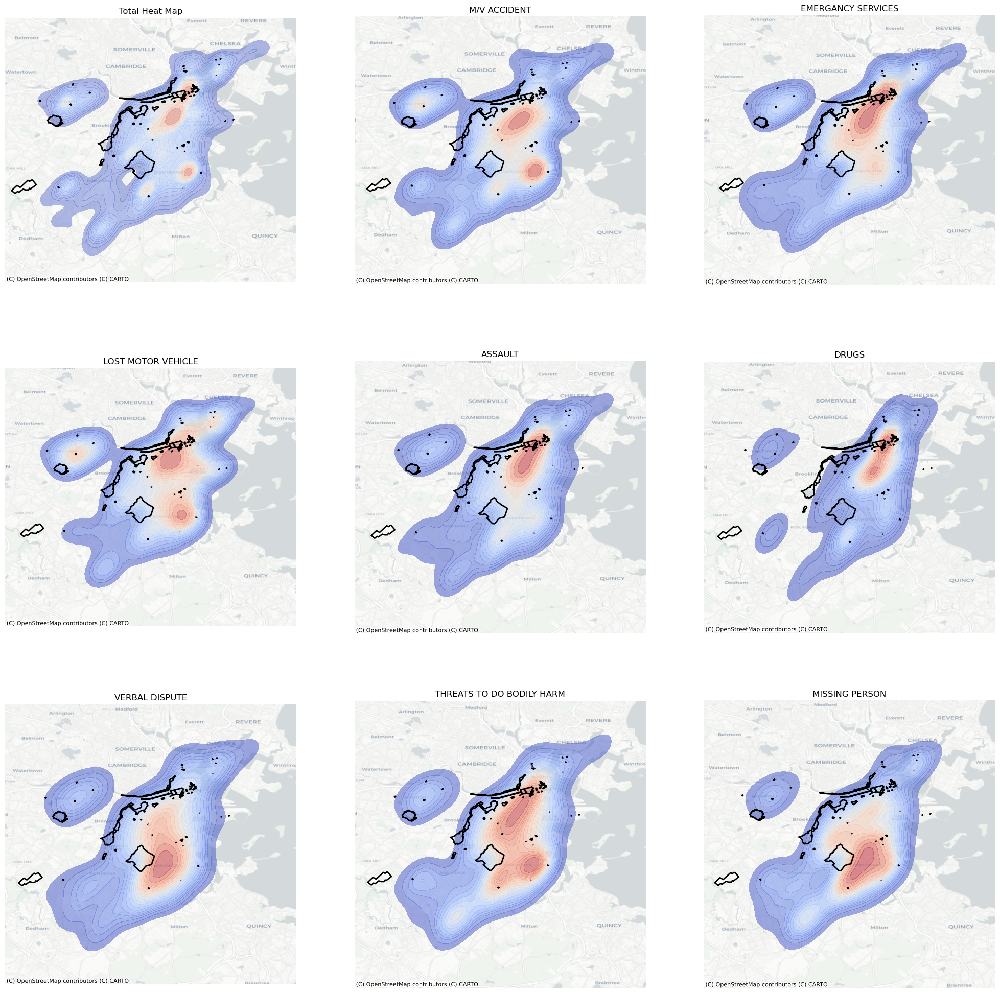

In [135]:
fig, axs = plt.subplots(3, 3, figsize=(25, 25))
axs = axs.flatten()
count = 1
sns.kdeplot(data=gdf,
            x='Long', 
            y='Lat', 
            fill=True,
            cmap='coolwarm',
            alpha=0.4,
            gridsize=200,
            levels=20,
            ax=axs[0])
Landmarks.plot(ax=axs[0],facecolor='none',edgecolor='black',linewidth=2)
cx.add_basemap(ax=axs[0], crs = gdf.crs.to_string(), source=basemap)
axs[0].set_title('Total Heat Map')
axs[0].axis('off')
for a in heat_list:
    sns.kdeplot(data=gdf[gdf['OFFENSE_GROUP'] == a],
            x='Long', 
            y='Lat', 
            fill=True,
            cmap='coolwarm',
            alpha=0.5, 
            gridsize=200,
            levels=20,
            ax=axs[count])
    Landmarks.plot(ax=axs[count],facecolor='none',edgecolor='black',linewidth=2)
    cx.add_basemap(ax=axs[count], crs = gdf.crs.to_string(), source=basemap)
    axs[count].set_title(a)
    axs[count].axis('off')
    count+=1

('WARNING: ', 172, ' is an island (no neighbors)')
('WARNING: ', 272, ' is an island (no neighbors)')
('WARNING: ', 290, ' is an island (no neighbors)')
('WARNING: ', 564, ' is an island (no neighbors)')
('WARNING: ', 565, ' is an island (no neighbors)')
('WARNING: ', 566, ' is an island (no neighbors)')
('WARNING: ', 138, ' is an island (no neighbors)')
('WARNING: ', 459, ' is an island (no neighbors)')
('WARNING: ', 18, ' is an island (no neighbors)')
('WARNING: ', 186, ' is an island (no neighbors)')
('WARNING: ', 502, ' is an island (no neighbors)')
('WARNING: ', 0, ' is an island (no neighbors)')
('WARNING: ', 83, ' is an island (no neighbors)')
('WARNING: ', 376, ' is an island (no neighbors)')
('WARNING: ', 63, ' is an island (no neighbors)')
('WARNING: ', 81, ' is an island (no neighbors)')
('WARNING: ', 85, ' is an island (no neighbors)')
('WARNING: ', 91, ' is an island (no neighbors)')
('WARNING: ', 118, ' is an island (no neighbors)')
('WARNING: ', 0, ' is an island (no nei

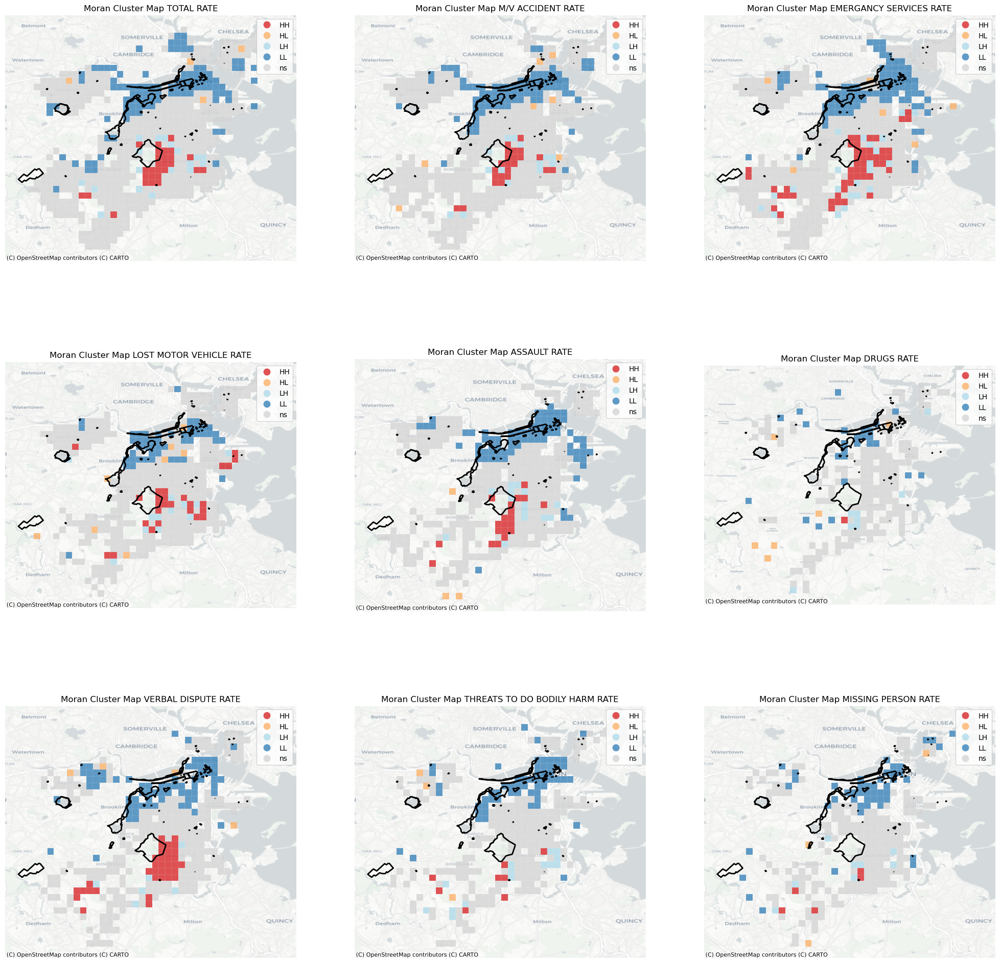

In [136]:
fig, axs = plt.subplots(3, 3, figsize=(25, 25))
axs = axs.flatten()
count = 0
for a in type:
    temp = gpd.GeoDataFrame(grida[['geometry',a]],geometry='geometry')
    temp = temp.loc[temp[a]!=0]
    Lw = weights.Queen.from_dataframe(temp)
    Lw.transform = 'R'
    Llocal_moran = esda.moran.Moran_Local(temp[a], Lw)
    esdaplot.lisa_cluster(Llocal_moran, temp, p=0.05, ax=axs[count], alpha =0.75)
    Landmarks.plot(ax=axs[count],facecolor='none',edgecolor='black',linewidth=2)
    cx.add_basemap(ax=axs[count], crs = grida.crs.to_string(), source=basemap)
    axs[count].set_title(f'Moran Cluster Map {a}')
    axs[count].axis('off')
    count+=1


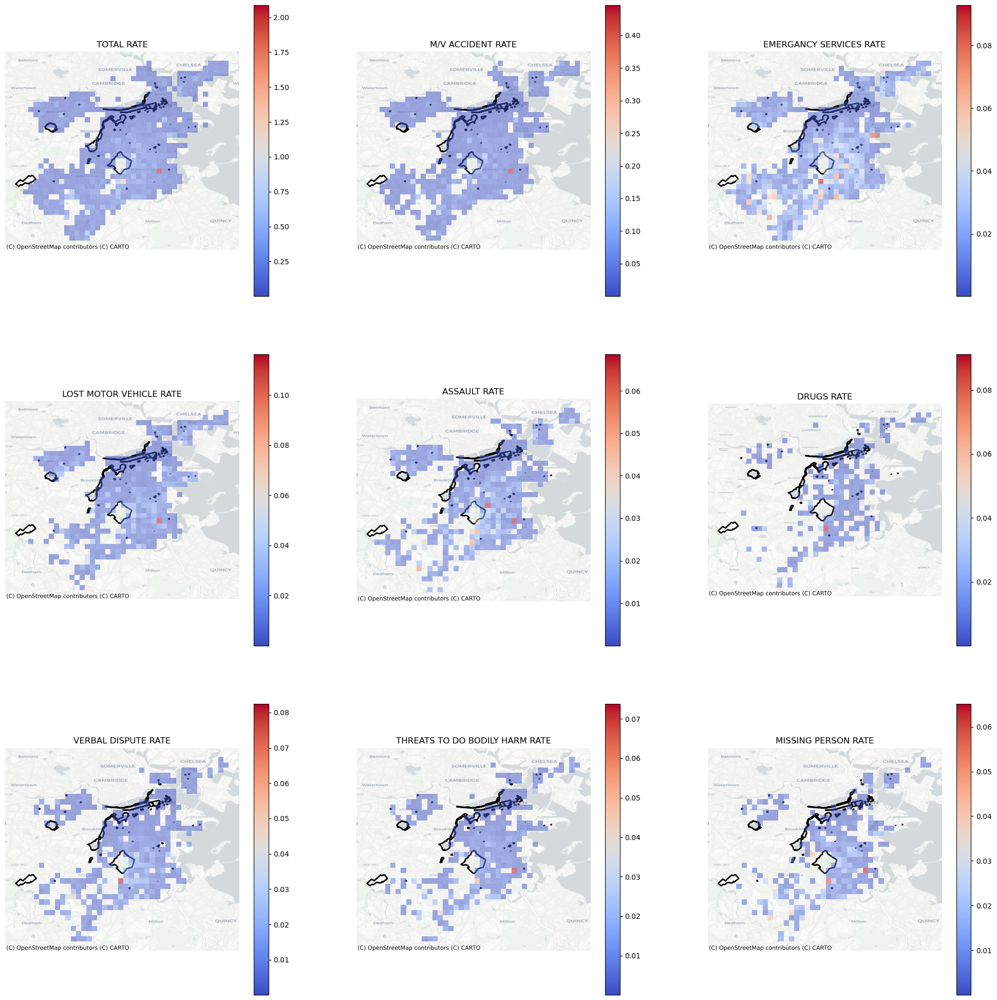

In [273]:
fig, axs = plt.subplots(3, 3, figsize=(25, 25))
axs = axs.flatten()
count = 0
for a in type:
    Landmarks.plot(ax=axs[count],facecolor='none',edgecolor='black',linewidth=2)
    grida[grida[a]!=0].plot(alpha=.5,column=grida[grida[a]!=0][a],markersize=5, ax=axs[count], legend=True, cmap='coolwarm')
    cx.add_basemap(ax=axs[count], crs = grida.crs.to_string(), source=basemap)
    axs[count].set_title(a)
    axs[count].axis('off')
    count+=1

(-71.19810923024276, -71.01845568211188, 42.274530674093384, 42.38602305137097)

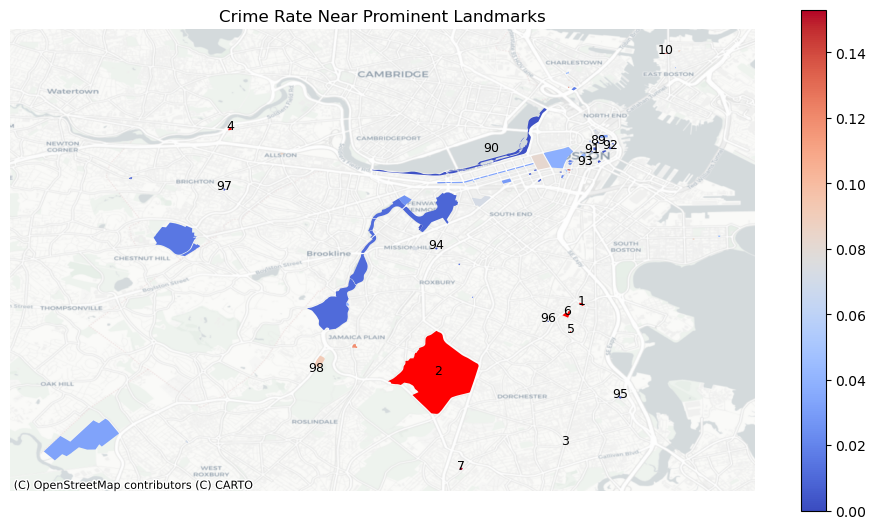

In [208]:
fig, axs = plt.subplots(figsize=(12,6.5))
Landmarks.query("RATE>.25").plot(column='RATE',legend=True, color='red',ax=axs)
Landmarks.query("RATE<=.25").plot(column='RATE',legend=True,cmap='coolwarm', ax=axs)
for i in [0,1,2,3,4,5,6,9,88,89,90,91,92,93,94,95,96,97]:
    axs.text(x=Landmarks.iloc[i,:]['x'], y=Landmarks.iloc[i,:]['y'], s= i+1,ha='center', fontsize=9)
cx.add_basemap(ax=axs, crs = grida.crs.to_string(), source=basemap)
axs.set_title('Crime Rate Near Prominent Landmarks')
axs.axis('off')

In [274]:
Landmarks.iloc[0:10,:][['Name_of_Pr','RATE']]

,Name_of_Pr,RATE
0,James Blake House,0.425000
1,Franklin Park,0.424242
2,Sidewalk Clock - Peabody Square,0.409091
3,Charles River Speedway Administration Building,0.300000
4,William Monroe Trotter House,0.291667
5,Dorchester North Burying Ground,0.256944
6,Fowler Clark Farm,0.152941
7,Hayden Building,0.147766
8,Boylston Building,0.145669
9,Trinity Neighborhood House,0.144737


In [176]:
Landmarks.iloc[-10:98,:][['Name_of_Pr','RATE']]

,Name_of_Pr,RATE
88,Stock Exchange Building,0.002345
89,Charles River Esplanade,0.002081
90,International Trust Company Building,0.002008
91,Batterymarch Building,0.001850
92,Proctor Building,0.000808
93,Vienna Brewery Complex,0.000000
94,Dorchester Pottery Works,0.000000
95,George Milliken House,0.000000
96,St. Gabriel's Monastery Building,0.000000
97,Lewis Dawson Farm House,NaN
